# Рынок заведений общественного питания Москвы

**Цель:**
- исследовать рынок заведений общественного питания Москвы.

**Задачи:**
- подготовить исследование рынка Москвы, найти интересные особенности;
- презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

**Ход:**
1. [Загрузка данных. Изучение общей информации](#info)

2. [Предобработка данных](#preproccesing):
- Работа с пропусками и дубликатами;
- Создание новых столбцов;

3. [Анализ данных](#analysis):
- [Исследуем количество объектов общественного питания по категориям;](#count)
- [Исследуем количество посадочных мест в местах по категориям;](#seats)
- [Рассмотрим соотношение сетевых и несетевых заведений в датасете;](#chain)
- [Найдем топ-15 популярных сетей в Москве;](#top)
- [Исследуем административные районы Москвы, присутствующие в датасете;](#district)
- [Визуализируем распределение средних рейтингов по категориям заведений;](#rating)
- [Работа с картой:](#map)
 - Построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого района;
 - Отобразим все заведения датасета на карте с помощью кластеров;
 - Построим фоновую картограмму (хороплет) со значениями средних чеков для каждого района;
 - Найдем улицы: топ-15 по количеству заведений, на которых находится только один объект общепита;
- [Прочие взаимосвязи](#correlation):
 - Анализ заведений, работающих круглосуточно и ежденевно;
 - Анализ общепита, расположенного на улицах из топ-15 по количеству заведений;
 - Исследование заведений с низким рейтингом;
- [Общий вывод к разделу](#conclusion_1)
4. [Детализируем исследование: открытие кофейни](#coffee)
5. [Презентация](#presentation)


<a id="info"> </a>
# 1. Загрузка данных. Изучение общей информации.

In [57]:
# Импорт библиотек

import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster

In [2]:
# Загрузка данных

places = pd.read_csv('/datasets/moscow_places.csv')

In [3]:
places.head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [4]:
places.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Изменить тип данных:
- seats - int64

Количество мест в заведении должно быть представлено целым числом.

In [5]:
places['seats'] = places['seats'].astype('Int64')

In [6]:
#places.query('seats.isna() == False')['seats'].astype('Int64')

<a id="preproccesing"> </a>
# 2. Предобработка данных.

**2.1. Работа с пропусками и дубликатами.**

In [11]:
# Проверим количество пропусков в процентах

pd.DataFrame(round(places.isna().mean()*100,))

,0
name,0.0
category,0.0
address,0.0
district,0.0
hours,6.0
lat,0.0
lng,0.0
rating,0.0
price,61.0
avg_bill,55.0


Пропуски наблюдяаются в 6 столбцах:
- hours, 
- price, 
- avg_bill, 
- middle_avg_bill, 
- middle_coffee_cup
- и seats.

В пяти стобцах (price, avg_bill, middle_avg_bill, middle_coffee_cup, seats) пропусков 40% и больше - лучше оставить их без изменения.

Взглянем подробнее на пропуски в стобце hours.

In [12]:
#places.query("(hours.isna()==True)")

В столбце hours 536 пропусков; при ближайшем рассмотрении мы видим либо маленькие сетевые точки без очевидного названия сети ("кафе-бар", "хинкальная"), либо несетевые точки без очевидного названия. 
Обработать такие пропуски вручную займет много времени.

Поэтому лучший выбор - оставить столбец без изменений.

In [13]:
# Проведем подсчет и удаление явных дубликатов

print(places.duplicated().sum())
places = places.drop_duplicates()

0


**2.2. Создание новых столбцов.**

Создадим столбец street с названиями улиц из столбца с адресом:

In [14]:
places['street'] = places['address'].str.replace('Москва, ', '') \
    .str.replace('МКАД,', 'МКАД') \
    .str.partition(',')[0]

Создадим столбец 'is_24/7' с обозначением, что заведение работает ежедневно и круглосуточно (24/7):

In [15]:
def working_hours(row):
    hours = row['hours']

    try:
        if 'ежедневно, круглосуточно' in hours:
            return True
        else:
            return False

    except TypeError:
        return False

In [16]:
places['is_24/7']=places.apply(working_hours,axis=1)

На этапе предобработки мы:
1. изменили тип данных в столбце seats (с float на int для экономии места),
2. подсчитали количество пропусков в датасете,
3. проверили данные на наличие дубликатов,
4. добавили два новых столбца:
- столбец street с названиями улиц из столбца с адресом,
- столбец 'is_24/7' с обозначением, что заведение работает ежедневно и круглосуточно (24/7).

В датасете 8406 строк и 14 столбцов. Пропущенные значения есть в шести столбцах:
- hours,
- price,
- avg_bill,
- middle_avg_bill,
- middle_coffee_cup
- и seats.
В пяти стобцах (price, avg_bill, middle_avg_bill, middle_coffee_cup, seats) пропусков 40% и больше - лучше оставить их без изменения. В столбце hours 6% пропусков. Выполнив срез по этому столбцу, мы увидим либо маленькие сетевые точки без очевидного названия сети ("кафе-бар", "хинкальная"), либо несетевые точки без очевидного названия. Обработать такие пропуски вручную займет много времени.
Поэтому лучший выбор - оставить столбец без изменений.

Очевидных дубликатов в датасете нет.

<a id="analysis"> </a>
# 3. Анализ данных

<a id="count"> </a>
**3.1. Исследуем количество объектов общественного питания по категориям.**

In [17]:
places['category'].value_counts()

кафе               2378
ресторан           2043
кофейня            1413
бар,паб             765
пиццерия            633
быстрое питание     603
столовая            315
булочная            256
Name: category, dtype: int64

In [18]:
# Первоначальный вариает графика - не слишком наглядный

#plt.figure(figsize=(12,5))
#plt.title('Количество объектов общественного питания по категориям', fontsize=15)
#places['category'].value_counts().plot.bar();

In [19]:
value_category = [2378, 2043, 1413, 765, 633, 603, 315, 256]
labels_category = ['кафе', 'ресторан', 'кофейня', 'бар,паб', 'пиццерия', 'быстрое питание', 'столовая', 'булочная']

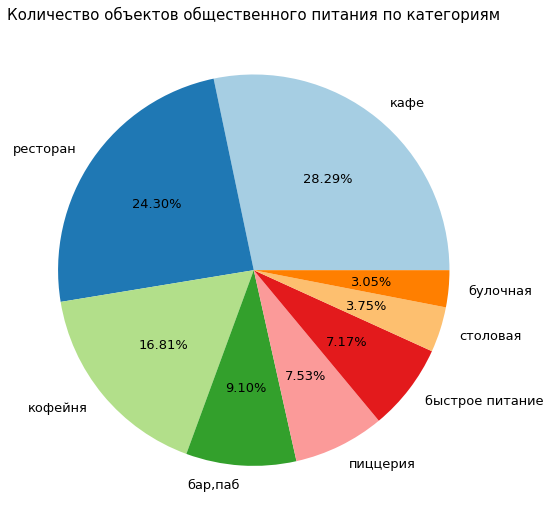

In [101]:
color = sns.color_palette("Paired")
plt.figure(figsize=(9,9))
plt.title('Количество объектов общественного питания по категориям', fontsize=15)
plt.pie(value_category,labels = labels_category, autopct='%1.2f%%', colors=color, textprops={'fontsize': 13})

plt.show()

Круговая диаграмма выше нагядно показывает соотношение различных категорий общественных заведений к общему количеству:
- больше всего в Москве - кафе, ресторанов и кофеен,
- потом идут бары и пабы, пиццерии и точки быстрого питания,
- и меньше всего - булочных и столовых.

<a id="seats"> </a>
**3.2. Исследуем количество посадочных мест в местах по категориям.**

In [111]:
# Посчитаем общее количество посадочных мест по категориям, а так же среднее и медианные значения

places.groupby('category')['seats'].agg(['sum','mean', 'median']).sort_values(by='sum', ascending=False).style.format('{:,.0f}')

,sum,mean,median
category,,,
ресторан,"154,869",122,86
кафе,"118,770",98,60
кофейня,"83,511",111,80
"бар,паб","58,281",125,82
пиццерия,"40,350",94,55
быстрое питание,"34,513",99,65
столовая,"16,359",100,76
булочная,"13,229",89,50


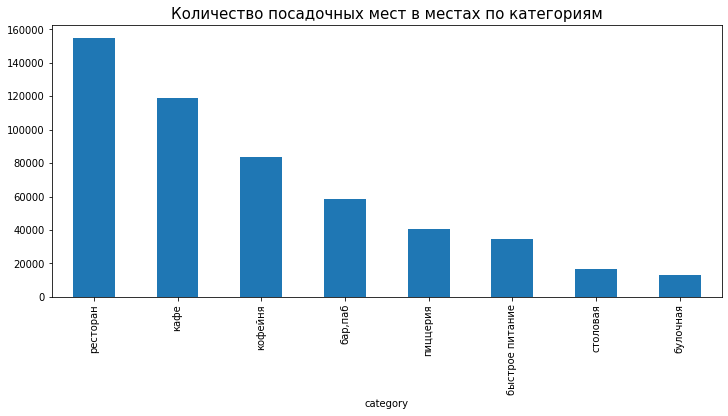

In [21]:
plt.figure(figsize=(12,5))
plt.title('Количество посадочных мест в местах по категориям', fontsize=15)
places.groupby('category')['seats'].sum().sort_values(ascending=False).plot.bar()
plt.show();

Количество посадочных мест перекликается с подсчетом количества объектов по категориям: кафе и ресторанов больше, чем баров и пабов, следовательно, посадочных мест в таких местах должно быть больше.

Но мы видим различие с данными на предыдущем шаге:
- ресторанов меньше, чем кафе в общей массе, но посадочных мест в ресторанах больше.

Различие средних и медианных значений говорит нам о выбросах - это могут быть общественные заведения с очень большим количеством посадочных мест (мы можем предположить, что бóльшее количество посадочных мест в заведениях крупных сетей, меньшее количество - в несетевых точках).

In [22]:
# Выполним срез, выделим сетевые заведения, сгруппируем по категориям и посчитаем медианное количество посадочных мест
# Выполним срез, выделим несетевые заведения, сгруппируем по категориям и посчитаем медианное количество посадочных мест
# Соединим две таблицы для наглядности, переименуем колонки

seats_chain = places.query('chain==1').groupby('category')['seats'].agg(['median'])
seats_not_chain = places.query('chain==0').groupby('category')['seats'].agg(['median'])
median_seats = seats_chain.merge(seats_not_chain, how='left', on='category'). \
     rename(columns={'median_x':'seats_chain', 'median_y':'seats_not_chain'})
median_seats

,seats_chain,seats_not_chain
category,,
"бар,паб",80.0,85.0
булочная,50.0,50.0
быстрое питание,75.0,56.0
кафе,70.0,55.0
кофейня,90.0,60.0
пиццерия,52.0,60.0
ресторан,98.0,80.0
столовая,80.0,66.0


Получившаяся таблица наглядно демонстрируем наши предположения - в несетевых заведениях посадочных мест меньше, чем в сетевых. Исключение составляют только 'бары, пабы' и 'булочные'.

<a id="chain"> </a>
**3.3. Рассмотрим соотношение сетевых и несетевых заведений в датасете.**

In [23]:
# Общее соотношение несетевых (0) и сетевых (1) заведений

places['chain'].value_counts()

0    5201
1    3205
Name: chain, dtype: int64

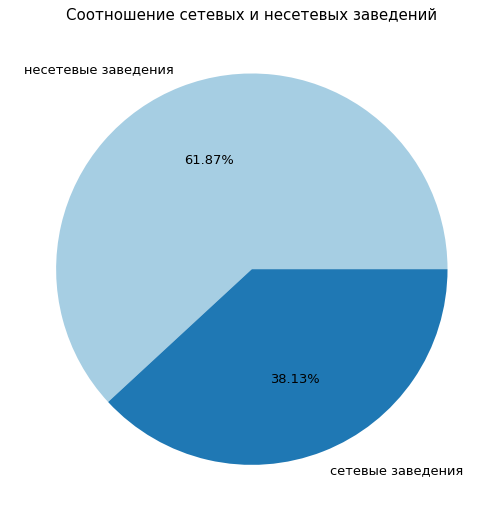

In [24]:
# Визуализация соотношения несетевых и сетевых заведений

labels_chain = ['несетевые заведения', 'сетевые заведения']
value_chain = [5201, 3205]

color = sns.color_palette("Paired")
plt.figure(figsize=(9,9))
plt.title('Соотношение сетевых и несетевых заведений', fontsize=15)
plt.pie(value_chain,labels=labels_chain, autopct='%1.2f%%', colors = color, textprops={'fontsize': 13})

plt.show()

Несетевых заведений в ~ 1.6 раза больше, чем сетевых: открытие маленькой чайханы для своих потребует меньших вложений, чем открытие сети ресторанчиков.

In [128]:
# Подсчитаем общее количество сетевых заведений с разбивкой по категориям

places.query('chain==1').groupby('category')['name'].count().sort_values(ascending=False)

category
кафе               779
ресторан           730
кофейня            720
пиццерия           330
быстрое питание    232
бар,паб            169
булочная           157
столовая            88
Name: name, dtype: int64

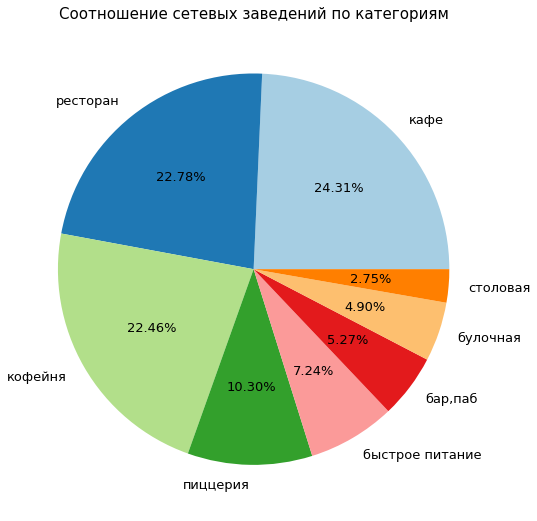

In [129]:
# Визуализируем количество сетевых заведений с разбивкой по категориям

labels_chain_category = ['кафе', 'ресторан', 'кофейня', 'пиццерия', 'быстрое питание', 'бар,паб', 'булочная', 'столовая']
value_chain_category = [779, 730, 720, 330, 232, 169, 157, 88]

color = sns.color_palette("Paired")
plt.figure(figsize=(9,9))
plt.title('Соотношение сетевых заведений по категориям', fontsize=15)
plt.pie(value_chain_category,labels=labels_chain_category, autopct='%1.2f%%', colors = color, textprops={'fontsize': 13})

plt.show()

In [111]:
# Соотношение соотношение несетевых и сетевых заведений, разбитых по категориям

pd.crosstab(places['chain'], places['category'], margins=False). \
                rename(index={0:'несетевые', 1:'сетевые'})

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
chain,,,,,,,,
несетевые,596,99,371,1599,693,303,1313,227
сетевые,169,157,232,779,720,330,730,88


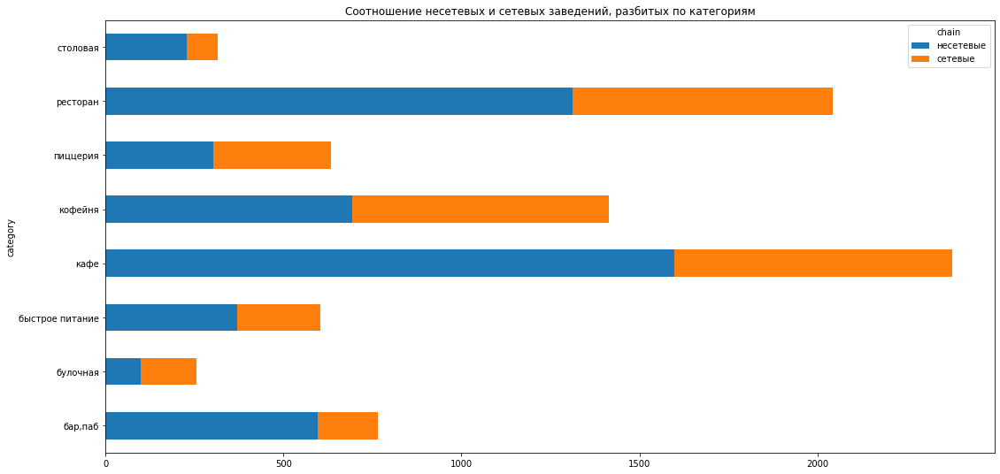

In [127]:
# Визуализация соотношения несетевых и сетевых заведений по категориям

crosstab_chain_category = pd.crosstab(places['category'], places['chain'], margins=False). \
                rename(columns={0:'несетевые', 1:'сетевые'})
color = sns.color_palette("Paired")
crosstab_chain_category.plot.barh(stacked=True, figsize=(18,9), \
                            title='Cоотношение несетевых и сетевых заведений, разбитых по категориям');

<a id="top"> </a>
**3.4. Найдем топ-15 популярных сетей в Москве.**

In [25]:
# Подсчитаем общее количество сетевых заведений с разбивкой по категориям

places.query('chain==1').groupby('category')['name'].count().sort_values(ascending=False)

category
кафе               779
ресторан           730
кофейня            720
пиццерия           330
быстрое питание    232
бар,паб            169
булочная           157
столовая            88
Name: name, dtype: int64

In [26]:
# Сгруппируем данные по названиям заведений и найдем топ-15 популярных сетей в Москве

places.query('chain==1').groupby('name')['name'].count().sort_values(ascending=False).head(15)

name
Шоколадница                            120
Домино'с Пицца                          76
Додо Пицца                              74
One Price Coffee                        71
Яндекс Лавка                            69
Cofix                                   65
Prime                                   50
Хинкальная                              44
КОФЕПОРТ                                42
Кулинарная лавка братьев Караваевых     39
Теремок                                 38
Чайхана                                 37
CofeFest                                32
Буханка                                 32
Му-Му                                   27
Name: name, dtype: int64

In [27]:
# Проверка "Хинкальных"

#places.query('(chain==1) & (name=="Хинкальная")')

In [28]:
# Срез данных без "Хинкальных"

places.query('(chain==1) & (name!="Хинкальная")').groupby('name')['name'].count().sort_values(ascending=False).head(15)

name
Шоколадница                            120
Домино'с Пицца                          76
Додо Пицца                              74
One Price Coffee                        71
Яндекс Лавка                            69
Cofix                                   65
Prime                                   50
КОФЕПОРТ                                42
Кулинарная лавка братьев Караваевых     39
Теремок                                 38
Чайхана                                 37
Буханка                                 32
CofeFest                                32
Му-Му                                   27
Drive Café                              24
Name: name, dtype: int64

In [29]:
chain_frequency = places.query('(chain==1) & (name!="Хинкальная")').groupby('name')['name'].count() \
                .sort_values(ascending=False).head(15)

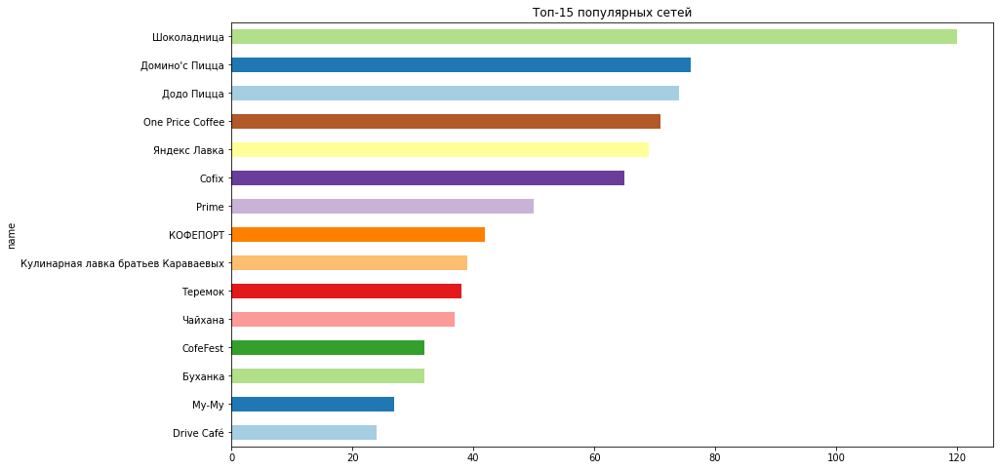

In [34]:
color = sns.color_palette("Paired")
chain_frequency.sort_values(ascending=True).plot.barh(color=color, stacked=True, figsize=(14,8), \
                                                      title='Топ-15 популярных сетей');

In [31]:
# Выполним фильтрацию данных, используя названия сетей, вошедших в топ-15

chain_frequency_query = places[places['name'].isin(['Шоколадница', "Домино'с Пицца", 'Додо Пицца', 'One Price Coffee', \
                            'Яндекс Лавка', 'Cofix', 'Prime', 'Drive Café', 'КОФЕПОРТ', \
                            'Кулинарная лавка братьев Караваевых', 'Теремок', 'Чайхана', 'CofeFest', 'Буханка', 'Му-Му'])]

In [32]:
# Подсчитаем, к каким категориям относятся эти заведения

chain_frequency_query['category'].value_counts()

кофейня            336
ресторан           171
пиццерия           151
кафе               105
булочная            25
быстрое питание      6
бар,паб              1
столовая             1
Name: category, dtype: int64

In [145]:
# Узнаем категории цен

chain_frequency_query['price'].value_counts()

средние          192
низкие            23
выше среднего      3
Name: price, dtype: int64

In [146]:
# Посчитаем общее количество заведений по районам

chain_frequency_query['district'].value_counts()

Центральный административный округ         201
Западный административный округ             92
Южный административный округ                90
Северный административный округ             90
Северо-Восточный административный округ     84
Восточный административный округ            73
Юго-Западный административный округ         69
Юго-Восточный административный округ        53
Северо-Западный административный округ      44
Name: district, dtype: int64

In [147]:
# Посчитаем медианный рейтинг

chain_frequency_query.groupby('name')['rating'].median().sort_values(ascending=False)

name
Буханка                                4.40
Кулинарная лавка братьев Караваевых    4.40
Додо Пицца                             4.30
Му-Му                                  4.30
One Price Coffee                       4.20
Prime                                  4.20
Домино'с Пицца                         4.20
КОФЕПОРТ                               4.20
Шоколадница                            4.20
Cofix                                  4.10
Drive Café                             4.10
Теремок                                4.10
Чайхана                                4.10
CofeFest                               4.05
Яндекс Лавка                           4.00
Name: rating, dtype: float64

In [35]:
# Отобразим общее количество заведений по районам и категориям

district_chain_frequency = pd.crosstab(chain_frequency_query['district'], chain_frequency_query['category'], margins=False)
district_chain_frequency

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
district,,,,,,,,
Восточный административный округ,1,1,1,4,30,20,16,0
Западный административный округ,0,5,1,13,41,15,17,0
Северный административный округ,0,8,0,10,40,20,12,0
Северо-Восточный административный округ,0,6,1,6,37,19,15,0
Северо-Западный административный округ,0,3,2,1,20,13,5,0
Центральный административный округ,0,1,1,43,94,9,52,1
Юго-Восточный административный округ,0,0,0,11,15,16,11,0
Юго-Западный административный округ,0,1,0,10,25,16,17,0
Южный административный округ,0,0,0,7,34,23,26,0


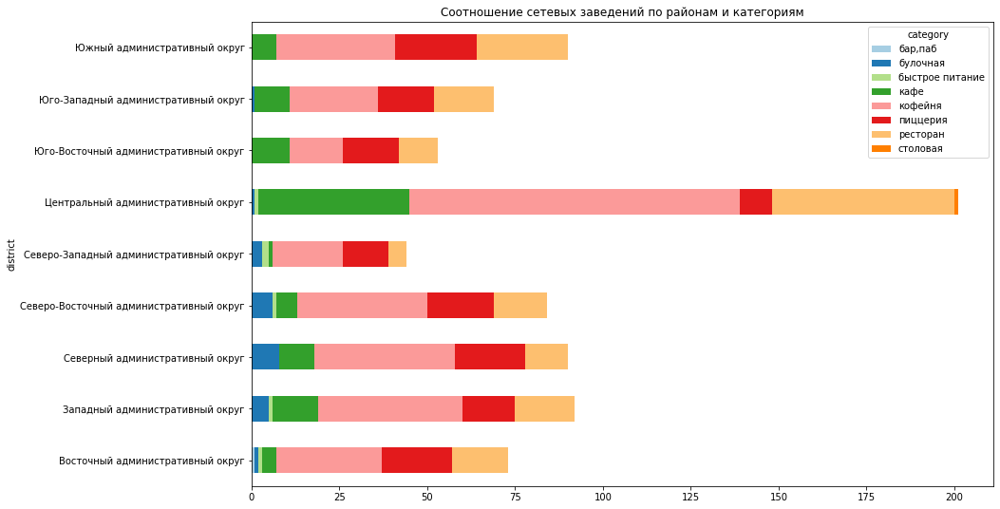

In [53]:
district_chain_frequency.plot.barh(stacked=True, figsize=(14,9), color=color, \
                            title='Соотношение сетевых заведений по районам и категориям');

На первый взгляд, заведения из топ-15 ничего не объединяет: 
- они находятся в разных районах Москвы, 
- относятся к разным категориям, 
- разное время открытия сетей - есть как старые сети (например, "Шоколадница" - 2000 г.), так и более молодые ("One Price Coffee" - 2018 г.).

Их объединяет средние ценовой сегмент (в большинстве) и возможность доставки или самовынос/самовывоз. 
В список вошли точки, специализирующие на кофе навынос ('Cofix', 'One Price Coffee'), заведения, подключенные к агрегатору Яндекс.Доставка, либо заведения, предоставляющие свои товары Яндекс.еде ('Кулинарная лавка братьев Караваевых', 'Буханка').

<a id="district"> </a>
**3.5. Исследуем административные районы Москвы, присутствующие в датасете.**

In [31]:
# Общее количество заведений по районам Москвы

places.groupby('district')['category'].count().sort_values(ascending=False)

district
Центральный административный округ         2242
Северный административный округ             900
Южный административный округ                892
Северо-Восточный административный округ     891
Западный административный округ             851
Восточный административный округ            798
Юго-Восточный административный округ        714
Юго-Западный административный округ         709
Северо-Западный административный округ      409
Name: category, dtype: int64

Больше всего заведений общественного питания в Центральном административном округе, меньше всего - в Северо-Западном округе.

In [32]:
# Количество заведений каждой категории, сгруппированные по районам Москвы

district_category = pd.crosstab(places['district'], places['category'], margins=False)
district_category

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
district,,,,,,,,
Восточный административный округ,53,25,71,272,105,72,160,40
Западный административный округ,50,37,62,239,150,71,218,24
Северный административный округ,68,39,58,235,193,77,189,41
Северо-Восточный административный округ,63,28,82,269,159,68,182,40
Северо-Западный административный округ,23,12,30,115,62,40,109,18
Центральный административный округ,364,50,87,464,428,113,670,66
Юго-Восточный административный округ,38,13,67,282,89,55,145,25
Юго-Западный административный округ,38,27,61,238,96,64,168,17
Южный административный округ,68,25,85,264,131,73,202,44


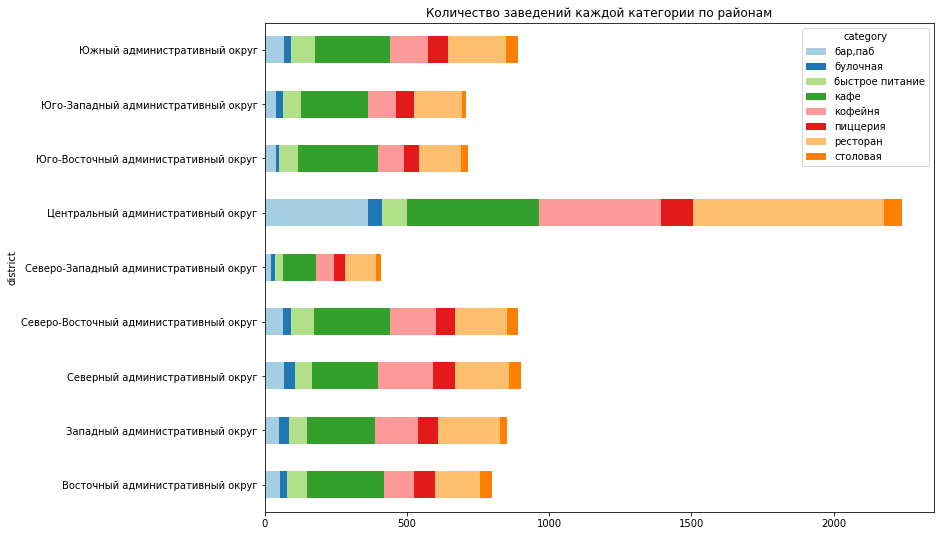

In [33]:
color = sns.color_palette("Paired")
district_category.plot.barh(stacked=True, figsize=(12,9), color=color, \
                            title='Количество заведений каждой категории по районам');

<a id="rating"> </a>
**3.6. Визуализируем распределение средних рейтингов по категориям заведений.**

In [34]:
# Усредненный рейтинг и медианное значение рейтинга в разных типах общепита

places.groupby('category')['rating'].agg({'mean', 'median'})

,median,mean
category,,
"бар,паб",4.4,4.387712
булочная,4.3,4.268359
быстрое питание,4.2,4.050249
кафе,4.2,4.123886
кофейня,4.3,4.277282
пиццерия,4.3,4.301264
ресторан,4.3,4.290357
столовая,4.3,4.211429


In [35]:
# Усредненный рейтинг и медианное значение рейтинга в разных районах города

places.groupby('district', as_index=False)['rating'].agg({'mean', 'median'})

,median,mean
district,,
Восточный административный округ,4.3,4.174185
Западный административный округ,4.3,4.181551
Северный административный округ,4.3,4.239778
Северо-Восточный административный округ,4.2,4.148260
Северо-Западный административный округ,4.3,4.208802
Центральный административный округ,4.4,4.377520
Юго-Восточный административный округ,4.2,4.101120
Юго-Западный административный округ,4.3,4.172920
Южный административный округ,4.3,4.184417


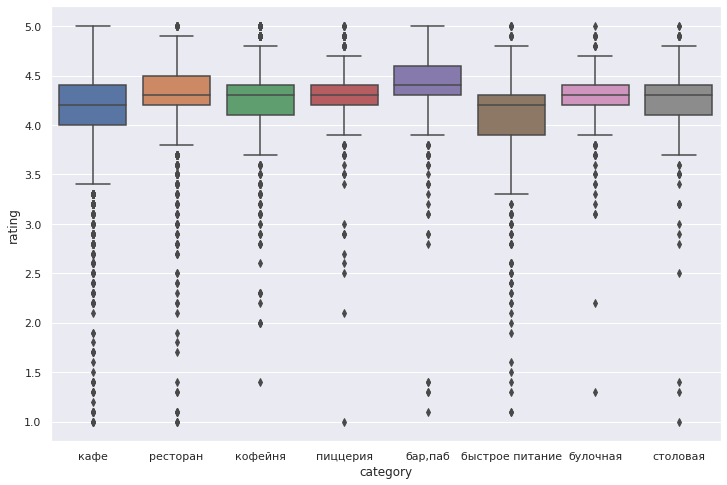

In [66]:
sns.set(rc={"figure.figsize":(12, 8)})
sns.boxplot(data=places, y='rating', x='category')
plt.show();

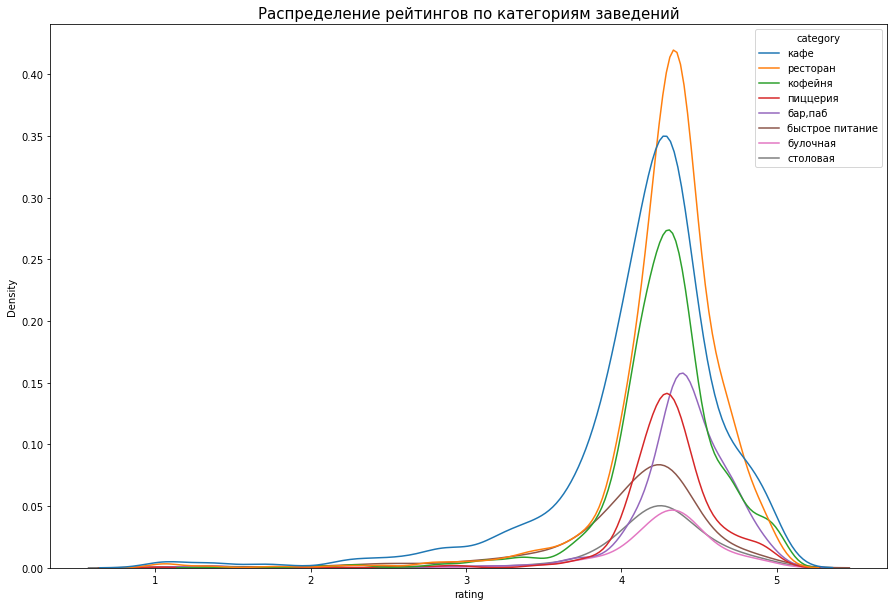

In [36]:
plt.figure(figsize=(15, 10))
plt.title('Распределение рейтингов по категориям заведений', fontsize=15)
sns.kdeplot(data=places, x="rating", hue="category", color=color);

Усредненные рейтинги в разных типах общепита мало различаются, как и усредненные рейтинги заведений, разделенных по районам. 

<a id="map"> </a>
**3.7. Работа с картой.**

**Построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого района**

In [67]:
state_geo = '/datasets/admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423

In [68]:
district_median_rating = places.groupby('district', as_index=False)['rating'].median()

In [69]:
map_choropleth = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=district_median_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGnBu',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(map_choropleth)

map_choropleth

**Отобразим все заведения датасета на карте с помощью кластеров.**

In [70]:
map_cluster = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

marker_cluster = MarkerCluster().add_to(map_cluster)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)
    
places.apply(create_clusters, axis=1)

map_cluster

**Найдем топ-15 улиц по количеству заведений.**

In [71]:
street_count = places.groupby('street', as_index=False)['name'].count().rename(columns={'name':'count'})

In [72]:
street_count.sort_values(by='count', ascending=False).head(15)

,street,count
1111,проспект Мира,184
794,Профсоюзная улица,122
1108,проспект Вернадского,108
525,Ленинский проспект,107
523,Ленинградский проспект,95
373,Дмитровское шоссе,88
455,Каширское шоссе,77
298,Варшавское шоссе,76
524,Ленинградское шоссе,70
547,Люблинская улица,60


In [73]:
street_count.query('count==1')

,street,count
0,1-й Автозаводский проезд,1
1,1-й Балтийский переулок,1
2,1-й Варшавский проезд,1
3,1-й Вешняковский проезд,1
5,1-й Голутвинский переулок,1
...,...,...
1457,улица Шкулёва,1
1458,улица Шкулёва 4,1
1460,улица Шухова,1
1463,улица Юннатов,1


**Построим фоновую картограмму (хороплет) со значениями средних чеков для каждого района**

In [74]:
# Категории цен в заведениях, сгруппированные по районам

pd.crosstab(places['district'], places['price'], margins=False)

price,высокие,выше среднего,низкие,средние
district,,,,
Восточный административный округ,27,30,18,169
Западный административный округ,51,68,11,177
Северный административный округ,50,47,18,228
Северо-Восточный административный округ,18,41,21,229
Северо-Западный административный округ,14,21,3,108
Центральный административный округ,271,240,34,666
Юго-Восточный административный округ,8,23,15,153
Юго-Западный административный округ,21,41,15,168
Южный административный округ,18,53,21,219


In [75]:
# Средний чек в заведениях, сгруппированные по районам

district_middle_avg_bill = places.groupby('district', as_index=False)['middle_avg_bill'].median()
district_middle_avg_bill

,district,middle_avg_bill
0,Восточный административный округ,575.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


In [76]:
map_choropleth_bill = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=district_middle_avg_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGnBu',
    fill_opacity=0.8,
    legend_name='название?',
).add_to(map_choropleth_bill)

map_choropleth_bill

<a id="correlation"> </a>
# 3.9. Прочие взаимосвязи.

**3.9.1. Анализ заведений, работающих круглосуточно и ежденевно.**

In [113]:
# Узнаем количество заведений работающих 24/7 и не работающих

places['is_24/7'].value_counts()

False    7676
True      730
Name: is_24/7, dtype: int64

In [117]:
# Сгруппируем заведения по районам и разделим на работающие ежедневно и круглосуточно и не работающие

pd.crosstab(places['district'], places['is_24/7'], margins=False)

is_24/7,False,True
district,,
Восточный административный округ,701,97
Западный административный округ,779,72
Северный административный округ,829,71
Северо-Восточный административный округ,816,75
Северо-Западный административный округ,366,43
Центральный административный округ,2111,131
Юго-Восточный административный округ,621,93
Юго-Западный административный округ,636,73
Южный административный округ,817,75


In [109]:
# Сгруппируем заведения по районам, категориям и режиму работы

pd.crosstab([places['district'], places['is_24/7']], places['category'], margins=True)

category                                         бар,паб  булочная  \
district                                is_24/7                      
Восточный административный округ        False         52        19   
                                        True           1         6   
Западный административный округ         False         45        37   
                                        True           5         0   
Северный административный округ         False         64        34   
                                        True           4         5   
Северо-Восточный административный округ False         59        24   
                                        True           4         4   
Северо-Западный административный округ  False         23         9   
                                        True           0         3   
Центральный административный округ      False        335        49   
                                        True          29         1   
Юго-Восточный административный округ    False         33        12   
                                        True           5         1   
Юго-Западный административный округ     False         38        26   
                                        True           0         1   
Южный административный округ            False         64        22   
                                        True           4         3   
All                                                  765       256   

category                                         быстрое питание  кафе  \
district                                is_24/7                          
Восточный административный округ        False                 50   239   
                                        True                  21    33   
Западный административный округ         False                 44   214   
                                        True                  18    25   
Северный административный округ         False                 44   207   
                                        True                  14    28   
Северо-Восточный административный округ False                 65   238   
                                        True                  17    31   
Северо-Западный административный округ  False                 23   103   
                                        True                   7    12   
Центральный административный округ      False                 73   434   
                                        True                  14    30   
Юго-Восточный административный округ    False                 52   234   
                                        True                  15    48   
Юго-Западный административный округ     False                 41   204   
                                        True                  20    34   
Южный административный округ            False                 61   238   
                                        True                  24    26   
All                                                          603  2378   

category                                         кофейня  пиццерия  ресторан  \
district                                is_24/7                                
Восточный административный округ        False        100        64       139   
                                        True           5         8        21   
Западный административный округ         False        141        69       206   
                                        True           9         2        12   
Северный административный округ         False        188        75       178   
                                        True           5         2        11   
Северо-Восточный административный округ False        156        65       171   
                                        True           3         3        11   
Северо-Западный административный округ  False         60        39        91   
                                        True           2         1        18   
Центральный ад

Проанализировав имеющиеся данные, мы видим, что большая часть общепита не работет круглосуточно и ежденевно. 

Больше всего заведений с круглосуточным режимом работы:
- в центральном округе,
- восточном и юго-восточном округе.

Количество заведений в центральном округе легко объяснить: в центральном округе расположено больше всего заведений, значит выше шанс встретить общепит, открытый ночью. Количество заведений в восточном и юго-восточных округах трудно объяснить очевидными причинами: в этих округах меньше всего заведений по Москве. Требуется дальнейшее исследование.

Чаще всего заведения с круглосуточным режимом работы встречаются в категориях "быстрое питание", "бар, паб" и "ресторан".

**3.9.2. Анализ общепита, расположенного на улицах из топ-15 по количеству заведений.**

In [78]:
# Создадим таблицу с заведениями, расположенными на улицах, вошедших в топ-15 по количеству заведений

places_top_street = places[places['street'].isin(['проспект Мира', 'Профсоюзная улица', 'проспект Вернадского', \
                              'Ленинский проспект', 'Ленинградский проспект', 'Дмитровское шоссе', 
                              'Каширское шоссе', 'Варшавское шоссе', 'Ленинградское шоссе', \
                              'Люблинская улица', 'улица Вавилова', 'Кутузовский проспект', 'улица Миклухо-Маклая', \
                              'Пятницкая улица', 'Алтуфьевское шоссе'])]

In [81]:
# Сгруппируем заведения, расположенные на улицах из топ-15, по округам

places_top_street['district'].value_counts()

Юго-Западный административный округ        286
Северный административный округ            230
Северо-Восточный административный округ    202
Южный административный округ               184
Западный административный округ            170
Центральный административный округ         108
Юго-Восточный административный округ        60
Name: district, dtype: int64

In [79]:
# Сгруппируем заведения, расположенные на улицах из топ-15, по категориям

places_top_street['category'].value_counts()

ресторан           332
кафе               321
кофейня            225
быстрое питание    113
бар,паб             95
пиццерия            87
столовая            40
булочная            27
Name: category, dtype: int64

In [80]:
# Сгруппируем заведения, расположенные на улицах из топ-15, по ценовым категория

places_top_street['price'].value_counts()

средние          304
выше среднего     85
высокие           73
низкие            24
Name: price, dtype: int64

In [82]:
top_street_middle_avg_bill = places_top_street.groupby('district', as_index=False)['middle_avg_bill'].median()

In [83]:
# Соединим и сравним две таблицы:
# в одну вошли значения среднего чека, сгруппированные по районам (вся Москва),
# в другую - значения среднего чека, сгруппированные по районам (топ-15 улиц по количеству заведений)

district_top_avg_bill = district_middle_avg_bill.merge(top_street_middle_avg_bill, how='left', on='district')
district_top_avg_bill = district_top_avg_bill.rename(columns={'middle_avg_bill_x':'all_avg_bill', \
                                                              'middle_avg_bill_y':'top_avg_bill'})
district_top_avg_bill

,district,all_avg_bill,top_avg_bill
0,Восточный административный округ,575.0,NaN
1,Западный административный округ,1000.0,1100.0
2,Северный административный округ,650.0,925.0
3,Северо-Восточный административный округ,500.0,600.0
4,Северо-Западный административный округ,700.0,NaN
5,Центральный административный округ,1000.0,1000.0
6,Юго-Восточный административный округ,450.0,350.0
7,Юго-Западный административный округ,600.0,650.0
8,Южный административный округ,500.0,512.5


На предыдущих этапах мы выделили топ-15 улиц, по количеству заведений. Выполнив срез данных по этому списку улиц, мы видим, что они расположены неравномерно в разных районах Москвы:
- больше всего в юго-западном округе,
- меньше всего - в центральном и юго-восточном округе.
В топ не вошли улицы из восточных и северо-западных округов.

На топовых улицах больше всего ресторанов, кафе и кофеен. 

Ценовые категории - "средняя" и "выше среднего". Сравнив значения средних чеков по всем районам и районам, вошедшим в топ, мы видим, что в заведениях, расположенных на топовых улицах, посетители тратят больше.
Исключение составляет только юго-восточный окргу - в заведениях на топовых улицах тратят меньше, чем в среднем по району. Можем предположить, что в топ вошли улицы с недорогими заведениями, имеющими ценовую категорию "средний" и "низкий".

In [128]:
# Срез топ-15 улиц по количеству заведений, выделение Юго-Восточного административного округа
# Подсчет ценовых категорий заведений

#places_top_street.query('district=="Юго-Восточный административный округ"').groupby('price')['price'].count()

**3.9.3. Исследование заведений с низким рейтингом.**

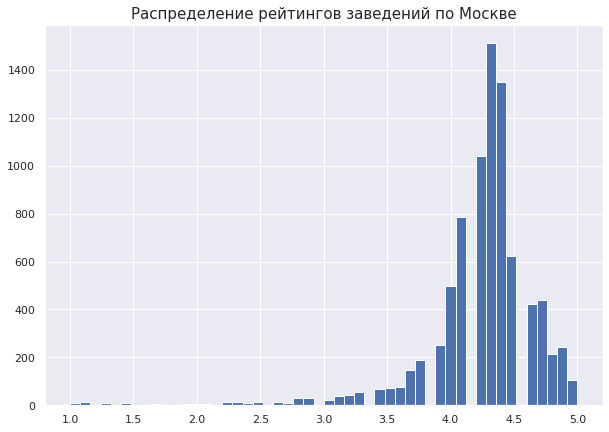

In [84]:
plt.figure(figsize=(10, 7))
plt.title('Распределение рейтингов заведений по Москве', fontsize=15)
plt.hist(data=places, x="rating", bins=50);

Для дальнейшего исследования в таблицу "places_low_raiting" были выделены заведения с рейтингом меньше 4.0.

In [85]:
# Выделим в отдельную таблицу заведения с рейтингом меньше 4.0

places_low_raiting = places.query('rating<4.0')

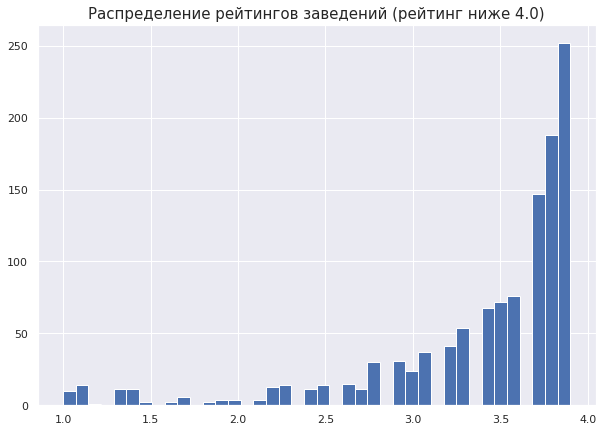

In [86]:
plt.figure(figsize=(10, 7))
plt.title('Распределение рейтингов заведений (рейтинг ниже 4.0)', fontsize=15)
plt.hist(data=places_low_raiting, x="rating", bins=40);

In [88]:
places_low_raiting['category'].value_counts()

кафе               543
ресторан           177
быстрое питание    162
кофейня            138
столовая            44
бар,паб             40
пиццерия            35
булочная            30
Name: category, dtype: int64

In [89]:
places_low_raiting['chain'].value_counts()

0    774
1    395
Name: chain, dtype: int64

In [87]:
places_low_raiting['district'].value_counts()

Юго-Восточный административный округ       170
Южный административный округ               155
Северо-Восточный административный округ    151
Восточный административный округ           148
Западный административный округ            141
Северный административный округ            123
Юго-Западный административный округ        118
Центральный административный округ         104
Северо-Западный административный округ      59
Name: district, dtype: int64

In [91]:
places_low_raiting['street'].value_counts().head(15)

проспект Мира              40
Профсоюзная улица          21
Каширское шоссе            16
Люблинская улица           16
Ленинский проспект         16
Новоясеневский проспект    14
проспект Вернадского       14
Волгоградский проспект     12
Ленинградское шоссе        11
Измайловское шоссе         10
Рязанский проспект         10
шоссе Энтузиастов           9
Ленинградский проспект      9
Щёлковское шоссе            9
Дмитровское шоссе           9
Name: street, dtype: int64

In [90]:
places_low_raiting['price'].value_counts()

средние          136
низкие            29
выше среднего     12
высокие            8
Name: price, dtype: int64

In [93]:
low_raiting_middle_avg_bill = places_low_raiting.groupby('district', as_index=False)['middle_avg_bill'].median()
district_middle_avg_bill.merge(low_raiting_middle_avg_bill, how='left', on='district'). \
            rename(columns={'middle_avg_bill_x':'all_avg_bill', 'middle_avg_bill_y':'low_raiting_avg_bill'})

,district,all_avg_bill,low_raiting_avg_bill
0,Восточный административный округ,575.0,335.0
1,Западный административный округ,1000.0,417.5
2,Северный административный округ,650.0,400.0
3,Северо-Восточный административный округ,500.0,400.0
4,Северо-Западный административный округ,700.0,300.0
5,Центральный административный округ,1000.0,587.5
6,Юго-Восточный административный округ,450.0,300.0
7,Юго-Западный административный округ,600.0,350.0
8,Южный административный округ,500.0,387.5


In [92]:
places_low_raiting.groupby('category')['rating'].median()

category
бар,паб            3.70
булочная           3.70
быстрое питание    3.60
кафе               3.60
кофейня            3.70
пиццерия           3.70
ресторан           3.60
столовая           3.75
Name: rating, dtype: float64

In [94]:
places_low_raiting['is_24/7'].value_counts()

False    991
True     178
Name: is_24/7, dtype: int64

In [95]:
pd.crosstab([places_low_raiting['district'], places_low_raiting['is_24/7']], places_low_raiting['category'], margins=False)

category                                         бар,паб  булочная  \
district                                is_24/7                      
Восточный административный округ        False          3         2   
                                        True           0         3   
Западный административный округ         False          1         3   
                                        True           3         0   
Северный административный округ         False          3         3   
                                        True           0         1   
Северо-Восточный административный округ False          5         2   
                                        True           1         0   
Северо-Западный административный округ  False          0         0   
                                        True           0         1   
Центральный административный округ      False         10         1   
                                        True           1         0   
Юго-Восточный административный округ    False          5         5   
                                        True           1         0   
Юго-Западный административный округ     False          3         6   
                                        True           0         0   
Южный административный округ            False          3         2   
                                        True           1         1   

category                                         быстрое питание  кафе  \
district                                is_24/7                          
Восточный административный округ        False                 14    60   
                                        True                   9    12   
Западный административный округ         False                 13    53   
                                        True                   7     6   
Северный административный округ         False                 14    44   
                                        True                   4     6   
Северо-Восточный административный округ False                 10    60   
                                        True                   7     6   
Северо-Западный административный округ  False                  7    27   
                                        True                   4     3   
Центральный административный округ      False                 10    42   
                                        True                   2     5   
Юго-Восточный административный округ    False                 16    67   
                                        True                  10    20   
Юго-Западный административный округ     False                  7    53   
                                        True                   5    12   
Южный административный округ            False                 14    57   
                                        True                   9    10   

category                                         кофейня  пиццерия  ресторан  \
district                                is_24/7                                
Восточный административный округ        False         14         4        17   
                                        True           0         0         4   
Западный административный округ         False         26         2        21   
                                        True           1         2         0   
Северный административный округ         False         21         5        15   
                                        True           1         1         0   
Северо-Восточный административный округ False         20         6        23   
                                        True           1         0         1   
Северо-Западный административный округ  False          5         0         5   
                                        True           0         0         3   
Центральный административный округ      False          9         2        14   
                                        True           1         0         4  

Подавляющие большинство заведений с низким рейтингом - кафе, далее идут - рестораны, заведения быстрого питания и кофейни. Меньше всего в датасете булочных с низким рейтингом, что логично - на предыдущих этапах мы узнали, что булочных меньше всего в Москве. Сетевых заведений почти в ~1.9 раза больше, чем несетевых. Ценовая категория - "средние".

Больше всего заведений с низким рейтингом в юго-восточном округе, меньше всего - в северо-западном. Список улиц из "Топ-15 по обощему количеству заведений" и "топ-15 по количеству заведений с низким рейтингом" во многом совпадает (9 общих улиц). 

~85% заведений не работают круглосуточно и ежедневно. Из тех заведений, которые работают круглосуточно и ежедневно, больше всего кафе и точек быстрого питания.


Усредненные рейтинги в разных типах общепита мало различаются (в средней 3.7).

<a id="conclusion_1"> </a>
# 3.10. Общий вывод к разделу

**1. Количество объектов общественного питания по категориям.**

Cоотношение различных категорий общественных заведений к общему количеству:
- больше всего в Москве - кафе (2378), ресторанов (2043) и кофеен (1413),
- потом идут бары и пабы (765), пиццерии (633) и точки быстрого питания (603),
- и меньше всего - булочных (315) и столовых (256).


**2. Количество посадочных мест в местах по категориям.**

Количество посадочных мест перекликается с количества объектов по категориям: кафе и ресторанов больше, чем баров и пабов, следовательно, посадочных мест в таких местах должно быть больше.

Но мы видим различия с данными на предыдущем шаге:
- ресторанов меньше, чем кафе в общей массе, но посадочных мест в ресторанах больше.

Проанализировав данные, мы увидели различие средних и медианных значений, что говорит нам о выбросах - это могут быть общественные заведения с очень большим количеством посадочных мест (мы можем предположить, что бóльшее количество посадочных мест в заведениях крупных сетей, меньшее количество - в несетевых точках).


**3. Соотношение сетевых и несетевых заведений в датасете.**

Сгруппировав данные по категориям и разделив заведения на сетевые и несетевые, мы подтвердили свое предположение - в сетевых заведениях в среднем посадочных мест больше, чем в несетевых. Исключение составляют только 'бары, пабы' и 'булочные'.

В рамках всего датасета несетевых заведений в ~ 1.6 раза больше, чем сетевых: открытие маленькой чайханы для своих потребует меньших вложений, чем открытие сети ресторанчиков. Но сгруппировав общепит по категориям, мы увидели исключения - сетевых булочных, кофеен и пиццерий больше, чем несетевых.

Разбив сетевые заведения по категориям, мы получили ожидаемые результаты - больше всего в датасете кафе, ресторанов и кофеен, меньше всего - столовых. Эти результаты соотносятся с цифрами, полученными ранее. 


**4. Топ-15 популярных сетей в Москве.**

Сгруппировав данные по названиям заведений, мы получили топ-15 популярных сетей. Проанализировав этот список, мы выяснили, что большая часть топа - это кофейни, рестораны и пиццерии. Большая часть этих заведений относится к средней категории цен. Территориально эти заведения расположены по всей Москве (~26% - в центральном округе).

На первый взгляд, заведения из топ-15 ничего не объединяет:

- они находятся в разных районах Москвы,
- относятся к разным категориям,
- разное время открытия сетей - есть как старые сети (например, "Шоколадница" - 2000 г.), так и более молодые ("One Price Coffee" - 2018 г.).
Их объединяет средние ценовой сегмент (в большинстве) и возможность доставки или самовынос/самовывоз. В список вошли точки, специализирующие на кофе навынос ('Cofix', 'One Price Coffee'), заведения, подключенные к агрегатору Яндекс.Доставка, либо заведения, предоставляющие свои товары Яндекс.еде ('Кулинарная лавка братьев Караваевых', 'Буханка').

Больше всего заведений общественного питания в Центральном административном округе (2242), меньше всего - в Северо-Западном округе (409). Центральный округ является и самым "дорогим" - в нем больше всего заведений, имеющих категории цен "высокие" и "выше среднего".

Усредненные рейтинги в разных типах общепита мало различаются, как и усредненные рейтинги заведений, разделенных по районам - примерно 4.2 вне зависимости от категории и района. 

В топ-15 улиц по количеству заведений вошли многие крупные улицы Москвы: проспект Мира, Профсоюзная улица, проспекты Вернадского, Ленинский и Ленинградский проспект, шоссе: Дмитровское, Каширское, Варшавское, Ленинградское шоссе и пр.	

Сравнив медианные значения средних чеков, мы выяснили, что самыми дорогими являются заведения в центральном и западном административных округах.

В топ-15 улиц по количеству заведений вошли многие крупные улицы Москвы: проспект Мира, Профсоюзная улица, проспекты Вернадского, Ленинский и Ленинградский проспект, шоссе: Дмитровское, Каширское, Варшавское, Ленинградское шоссе и пр. В этот топ не вошли улицы из восточного и северо-западных округов Москвы. Заведения, расположенные на этих улицах имеют категории цен: средние, выше среднего и высокие. Чаще всего на этих улицах размещаются рестораны, кафе и кофейни.

Средние чеки в заведениях, расположенных на улицах из топ-15, обычно выше, чем средние чеки по датасету.


**5. Исследование заведений с низким рейтингом.**

Далее мы выполнили срез по датасету и выделили в отдельную таблицу заведения, имеющие рейтинг ниже 4.0. Это значение было выбрано не случайно - большая часть заведений Москвы имеют рейтинг 4.0 и выше. 
Мы предполагаем два возможных варианта:
1. общепиты Москвы стараются держать высокую планку качества обслуживания,
2. заведения с низким рейтингом чаще закрываются и их меньше в базе.

Заведения с рейтингом ниже 4.0 (далее мы будем называть его "низкий рейтинг") встречаются во всех районах Москвы. Больше всего заведений с низким рейтингом относятся к категории "кафе", несетевых заведений встречается больше, чем сетевых. Цены в таких заведениях - средние.

Заведения с низким рейтингом встречаются на улицах из топ-15 по количеству заведений, что ожидаемо: чем больше точек общепита на улице, тем выше шанс встретить там некачественное обслуживание.

Рейтинг таких заведений в среднем ниже ~ 3.7 вне зависимости от категории. Средний чек в таких заведениях ниже по сравнению со средним чеком по всему датасету.

Заведения с низким рейтингом реже работают ежедневно и круглосуточно (исключения встречаются в категориях "кафе" и "быстрое питание").


<a id="coffee"> </a>
# 4. Детализируем исследование: открытие кофейни

In [96]:
# Выделим все кофейни в отдельный датасет

places_coffee_house = places.query('category=="кофейня"')

In [97]:
places_coffee_house['name'].count()

1413

In [98]:
places_coffee_house['price'].value_counts()

средние          377
низкие            68
высокие           17
выше среднего     14
Name: price, dtype: int64

In [99]:
# Сгруппируем кофейни по районам

places_coffee_house.groupby('district')['district'].count().sort_values(ascending=False)

district
Центральный административный округ         428
Северный административный округ            193
Северо-Восточный административный округ    159
Западный административный округ            150
Южный административный округ               131
Восточный административный округ           105
Юго-Западный административный округ         96
Юго-Восточный административный округ        89
Северо-Западный административный округ      62
Name: district, dtype: int64

In [100]:
# Добавим кофейни на карту

map_cluster_coffee_house = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

marker_cluster_coffee_house = MarkerCluster().add_to(map_cluster_coffee_house)

def create_clusters_coffee_house(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster_coffee_house)
    
places_coffee_house.apply(create_clusters_coffee_house, axis=1)

map_cluster_coffee_house

In [101]:
# Выделим в отдельную таблицу кофейни, работающие круглосуточно.

coffee_house_24_7 = places_coffee_house[places_coffee_house['is_24/7'] == True]

In [102]:
coffee_house_24_7['name'].value_counts()

Шоколадница           17
Кофемания              8
Wild Bean Cafe         6
Wild Bean              5
Кофе Хауз              3
You&coffee             2
Cofix                  2
Кофе с собой           2
Столица                1
Кофейня One&Double     1
Лаванда Кофе           1
One more, please       1
Гоголь-Моголь          1
Пирог Хауз             1
Кофе On                1
One Price Coffee       1
One And Double         1
Cinnabon               1
Молоко                 1
FoodMoscowCoffee       1
The wild bean cafe     1
One&Double             1
Name: name, dtype: int64

Круглосуточно работают 59 кофеен в 22 сетях. Но (предположительно) 'Wild Bean Cafe', 'Wild Bean' и 'The wild bean cafe' - это одна и та же сеть. Как и 'One&Double' и 'Кофейня One&Double'. В итоге - 19 сетей кофеен.

In [103]:
# Добавим на карту кофейни, работающие круглосуточно

map_cluster_coffee_24_7 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

marker_cluster_coffee_24_7 = MarkerCluster().add_to(map_cluster_coffee_24_7)

def create_clusters_coffee_24_7(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster_coffee_24_7)
    
coffee_house_24_7.apply(create_clusters_coffee_24_7, axis=1)

map_cluster_coffee_24_7

In [104]:
# Узнаем, какие рейтинги выставляли кофейням

#places_coffee_house['rating'].value_counts()

In [105]:
# Посчитаем медианное и среднее значение рейтинга.

places_coffee_house.groupby('district')['rating'].agg({'mean', 'median'})

,mean,median
district,,
Восточный административный округ,4.282857,4.3
Западный административный округ,4.195333,4.2
Северный административный округ,4.291710,4.3
Северо-Восточный административный округ,4.216981,4.3
Северо-Западный административный округ,4.325806,4.3
Центральный административный округ,4.336449,4.3
Юго-Восточный административный округ,4.225843,4.3
Юго-Западный административный округ,4.283333,4.3
Южный административный округ,4.232824,4.3


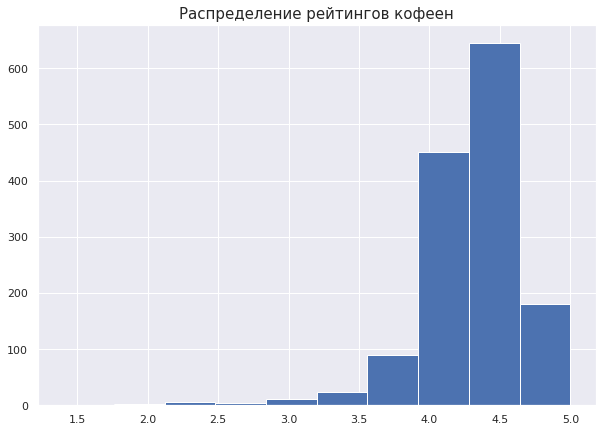

In [106]:
plt.figure(figsize=(10, 7))
plt.title('Распределение рейтингов кофеен', fontsize=15)
plt.hist(data=places_coffee_house, x="rating");

In [107]:
# Средняя цена чашки капучино

places_coffee_house['middle_coffee_cup'].median()

170.0

In [108]:
# Средняя цена чашки капучино с разбивкой по районам

places_coffee_house.groupby('district')['middle_coffee_cup'].median().sort_values(ascending=False)

district
Юго-Западный административный округ        198.0
Центральный административный округ         190.0
Западный административный округ            189.0
Северо-Западный административный округ     165.0
Северо-Восточный административный округ    162.5
Северный административный округ            159.0
Южный административный округ               150.0
Юго-Восточный административный округ       147.5
Восточный административный округ           135.0
Name: middle_coffee_cup, dtype: float64

# Рекомендации.

В имеющимся у нас датасете 8406 названий общественных заведений, разделенных по категориям. Кофейни находятся на третьем месте по количеству заведений (1413), из них несетевых - 693, сетевых - 720. Это соотношение (примерно один к одному) дает нам понять, что рынок не монополизирован сетевым точкам.

В начале исследования рынка, мы сгруппировали сети по количеству открытых заведений и получили топ-15 сетей по Москве. В этот список вошли несколько крупных сетей кофеен:
- Шоколадница, 
- One Price Coffee,
- Cofix,
- Prime,
- КОФЕПОРТ,
- Drive Cafe
- и CofeFest.

В меню всех вошедших в этот список сетей есть кофе и чай.

"Шоколадница" занимает первое место в топ-15 по Москве по нескольким причинам:
- дата открытия - первые кофейни открылись в 2000 г., у "Шоколадницы" было много времени, чтобы занять рынок;
- возможность взять кофе на вынос;
- обширное меню, которое включает в себя не только кофе и закуски к нему, но и полноценные блюда;
- чаще всего "Шоколадница" представлена не островом с кофемашиной в торговом центре, а полноценной кофейней с неким количеством посадочных мест;
- режим работы - круглосуточно и ежедневно (отдельные точки);
- "Шоколадница" подключена к агрегатору яндекс.доставки - большая часть меню - первые и вторые блюда, кофе и чай - в меньшенстве.

Общественные заведения распределены по округам неоднородно:
- больше всего - в центральном округе (2242);
- Северный, Южный, Северо-Восточный и Западный округ (850-900);
- Восточный, Юго-Восточный и Юго-Западные округа (700-800);
- и меньше всего в Северо-Западном округе (409).

Если ограничить нашу выборку и оставить только кофейни, мы увидим такое же соотношение по разным районам города:
- центральный округ представлен лучше всего (428),
- Северный, Северо-Восточный, Западный и Южный округа (130-190);
- Восточный, Юго-Восточный и Юго-Западные округа (89-105);
- меньше всего в Северо-Западный административный округе - 62.

В ходе исследования мы сгруппировали кофейни и выделили те, которые работают круглосуточно и ежедневно. Мы получили список, состоящий из 59 кофеен, разделенных на 19 сетей. В этом списке первое место по количеству круглосуточных кофеен заняла сеть "Шоколадница".

Всего в датасете 1413 кофеен, мы знаем ценовую политику ~33 % заведений. Большая заведений с известной ценовой политикой относится к среднему ценовому сегменту.

Медианное значение чашки капучино по всем заведениям Москвы составляет 170 рублей. Сгруппировав данные по районам, мы получили несколько другие значения:
- самые дорогие районы для покупки капучино - Юго-Западный, Центральный и Западный (189-198);
- средние - Северо-Западный, Северо-Восточный, Северный, Южный и Юго-Восточный округа (147.5-165);
- самое дешевое капучино в восточном округе - 135 рублей.

В дальнейшем стоит выбирать стоимость чашки в зависимости от района.

Для ответа на вопрос "какие рекомендации можно дать потенциальным инвесторам?", стоит ответить на вопрос "кто является потенциальным потербителем нашего товара?". В данном случая, товар - кофе.
Представим среднего посетителя кофейни без пола и возраста. Он покупает кофе в будни и в выходные. Скорее всего, он пьет кофе с утра, может быть - в течении рабочего дня и вряд ли - поздно вечером. Это стоит учитывать при планировании время работы. Но и здесь могут быть исключения в зависимости от местоположения - если кофейня расположена в спальном районе, значит основные утренние посетители заглядывают за кофе по пути на работу (7.00 - 7.30), а если вокруг кофейни расположены офисные здания и бизнес-центры, то открываться лучше в 8.00 - 8.30. Вне зависимости от времени открытия возможность взять кофе на вынос будет плюсом. Время закрытия также может сдвинуться в зависимости от местоположения - офисные работники вряд ли надолго задержатся после работы для того, чтобы зайти за кофе, а жителям спальных районов нужно потратить время, чтобы добраться до дома и зайти в кофейню. Продуманное и обширное меню с горячими блюдами станут большим плюсом вне зависимости от местоположения кофейни, а позиции по типу "айриш кофе" привлекут посетителей в вечерние часы. Бизнес ланч и подключение к агрегатору яндекс.доставки закроет окно без клиентов в дневные часы. Потенциальную кофейню стоит открывать ежедневно.

При выборе местоположения мы руководствовались несколькими приципами:
1. нам нужна здоровая конкуренция, но в нише должны остаться свободные места;
2. приемлимая арендная плата;
3. наличие хорошо развитой инфраструктуры (метрополотен) увеличит поток потенциальных клиентов и облегчит им доступ в кофейню.

Исходя из этих пунктов мы сразу исключили центральный и северные округа - дорогая аренда, большая количество уже открытых заведений, наличие крупных сетей рядом. Так же мы исключим юго-западный округ: большую часть территории занял битцевский лесопарк, оставшаяся территория - спальные районы, но с труднодоступным метрополитеном. 

Под вопросом восточный округ - нужно провести более подробное исследование. По имеющимся у нас данным, этот район не самый подходящий. Заведений общепита не много, но много заведений с рейтингом ниже 4.0 и средний чек - один из самых низких по всем районам города. С другой стороны, у этого района много плюсов: как мы уже сказали, мало конкурентов - открытие общепита с достойным уровнем обслуживания и средней категорией цен привлечет много потенциальных покупателей. Так же плюс - активное строительство новых жк и наличие развитой сети метрополитена (несколько веток).

Хорошими районами будут южный и юго-восточный, а так же северо-западный. Эти три района во многом похожи наличием парков на территории, а так же соотношение жилой застройки и коммерческой. Это обеспечит приток потребителей в течении всей недели.

<a id="presentation"> </a>
# 5. Презентация

<https://github.com/ziadove/ya_project_4_catering/blob/b0747fd967e46233bc50b8b396ada482c59e0d6f/presentation.pdf>